# Objective

Part A
- Plot consensus annotations
- Plot expert annotations
- Compare their error modes

Part B
- Plot the predictions using the model trained on consensus
- Plot the predictions using the model trained on expert
- Compare their error modes

In [1]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
from matplotlib.lines import Line2D
from skimage.io import imread
from skimage.feature import blob_log
from sklearn.neighbors import KDTree
from instapipeline import param
import warnings
warnings.filterwarnings('ignore')

In [2]:
test_img_filename = 'ISS_rnd0_ch1_z0'
consensus_path = './consensus/%s/total.csv' % test_img_filename
expert_path = './test_images_filtered/coords/%s.csv' % test_img_filename
test_img_path = './test_images_filtered/images/%s.png' % test_img_filename
correctness_threshold = 10
incorrect_color = 'xkcd:light magenta'

In [3]:
df_expert = pd.read_csv(expert_path)
df_consensus = pd.read_csv(consensus_path)
arr_expert = df_expert[['col', 'row']].to_numpy()
expert_blobs_kdt = KDTree(arr_expert, leaf_size=2, metric='euclidean')
arr_consensus = df_consensus[['centroid_x', 'centroid_y']].to_numpy()
im = imread(test_img_path)

# Part A

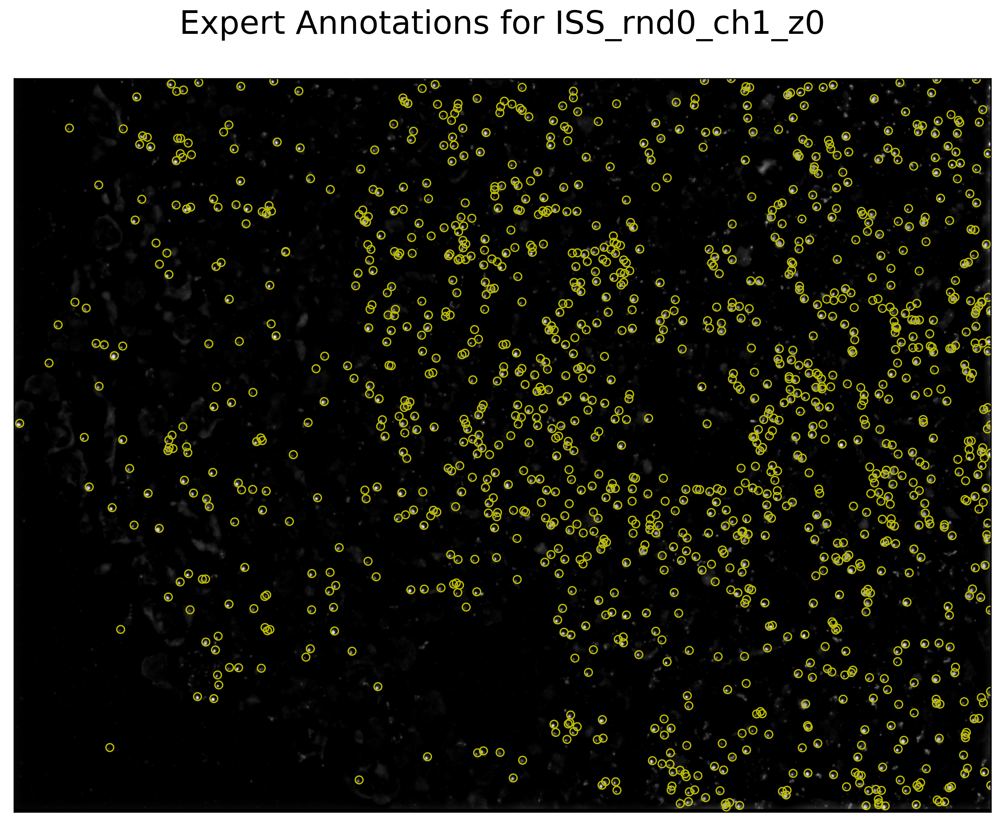

In [4]:
plt.figure(figsize=(im.shape[1]/100, im.shape[0]/100), dpi=300)
plt.imshow(im, cmap='gray')
plt.scatter(df_expert.col, df_expert.row, facecolor='None', edgecolor='y')
plt.xlim(0, im.shape[1])
plt.ylim(0, im.shape[0])
plt.xticks([])
plt.yticks([])
plt.title('Expert Annotations for %s\n' % test_img_filename, fontsize=25)
plt.show()

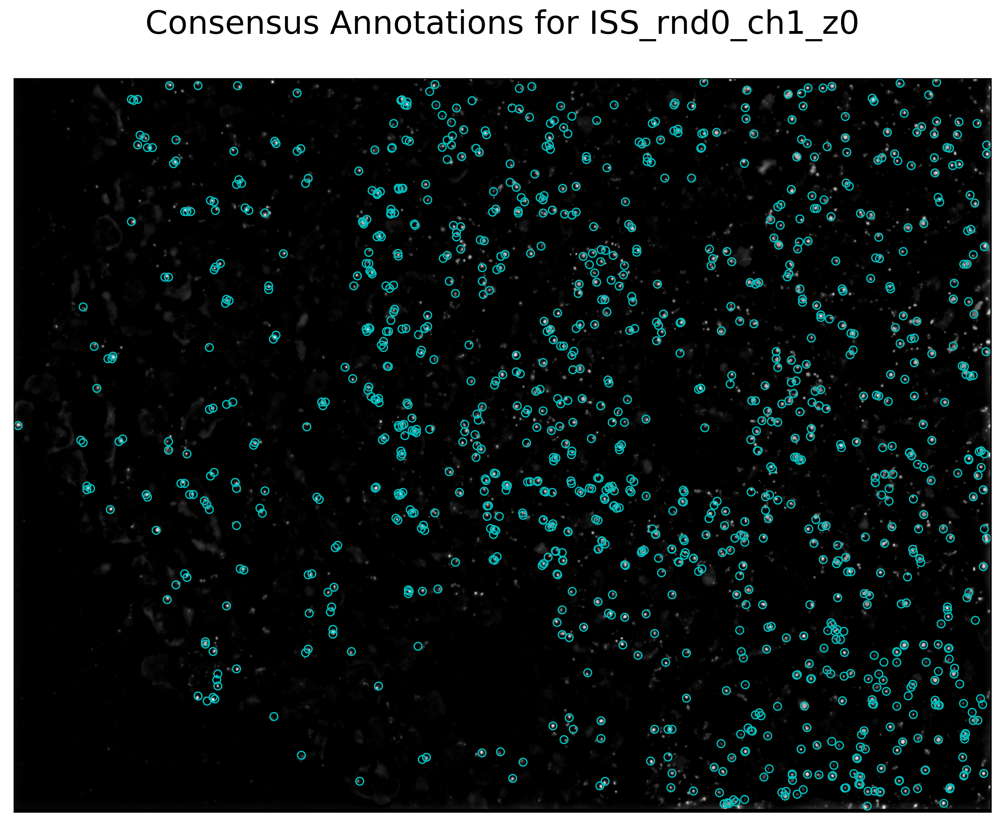

In [5]:
plt.figure(figsize=(im.shape[1]/100, im.shape[0]/100), dpi=300)
plt.imshow(im, cmap='gray')
plt.scatter(df_consensus.centroid_x, df_consensus.centroid_y, facecolor='None', edgecolor='c')
plt.xlim(0, im.shape[1])
plt.ylim(0, im.shape[0])
plt.xticks([])
plt.yticks([])
plt.title('Consensus Annotations for %s\n' % test_img_filename, fontsize=25)
plt.show()

In [6]:
ref_kdt = KDTree(arr_expert, leaf_size=2, metric='euclidean')
dist, ind = ref_kdt.query(arr_consensus, k=1)
distances = [x[0] for x in dist]
df_consensus['dist_to_expert'] = distances
df_incorrect = df_consensus[df_consensus.dist_to_expert > correctness_threshold]

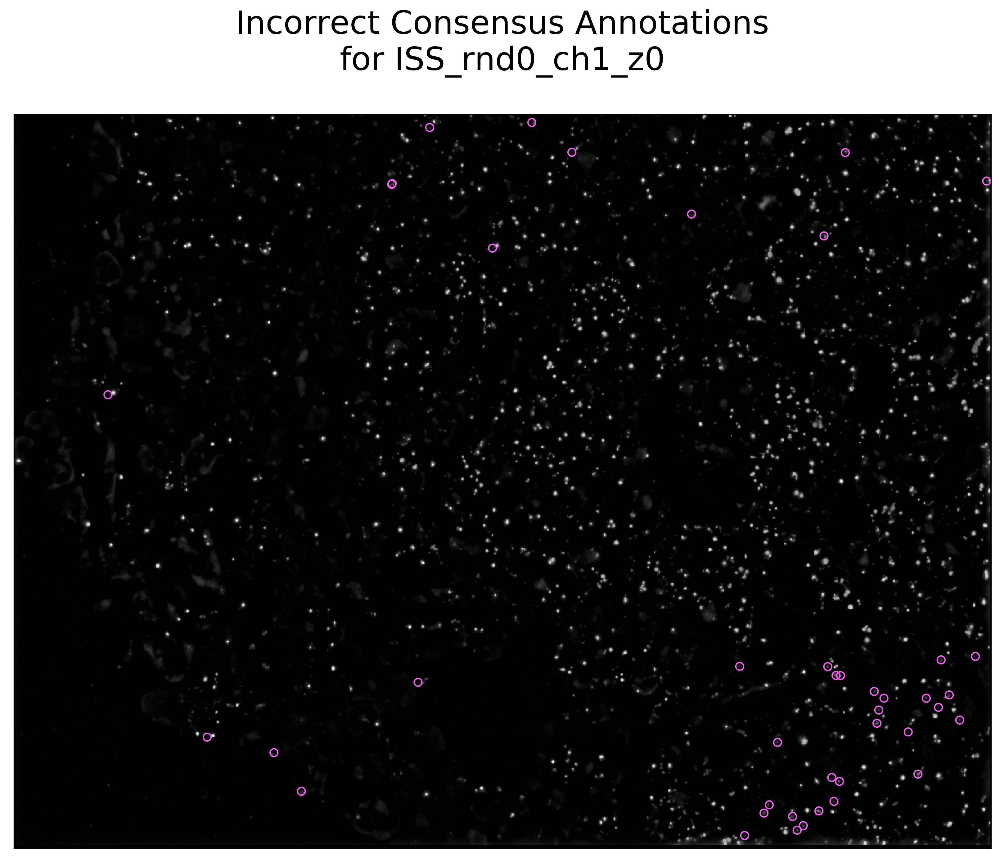

In [29]:
plt.figure(figsize=(im.shape[1]/100, im.shape[0]/100), dpi=300)
plt.imshow(im, cmap='gray')
plt.scatter(df_incorrect.centroid_x, df_incorrect.centroid_y,
            facecolor='None', edgecolor=incorrect_color)
plt.xlim(0, im.shape[1])
plt.ylim(0, im.shape[0])
plt.xticks([])
plt.yticks([])
plt.title('Incorrect Consensus Annotations\nfor %s\n' % test_img_filename, fontsize=25)
# plt.savefig('incorrect_consensus_for_%s.pdf' % test_img_filename, transparent=True, bbox_inches="tight")
plt.show()

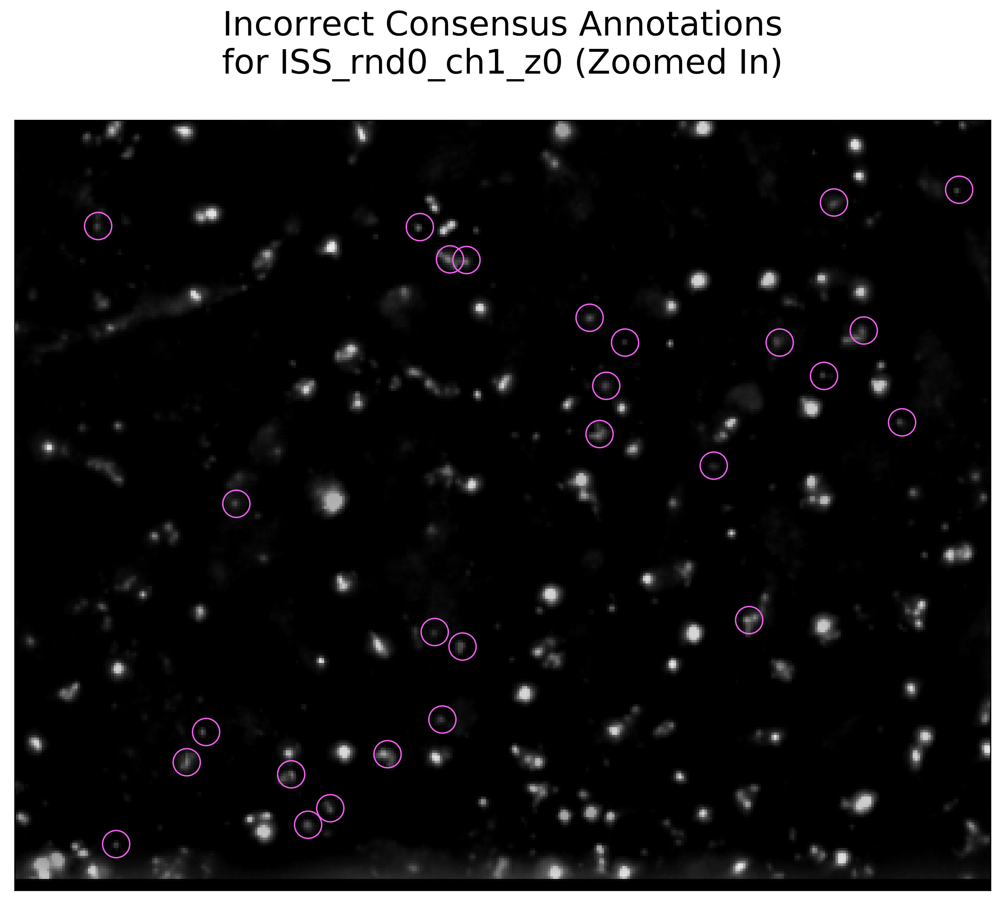

In [30]:
plt.figure(figsize=(im.shape[1]/100, im.shape[0]/100), dpi=300)
plt.imshow(im, cmap='gray')
plt.scatter(df_incorrect.centroid_x, df_incorrect.centroid_y,
            facecolor='None', edgecolor=incorrect_color, s=400)
plt.xlim(1000, 1380)
plt.ylim(0, 300)
plt.xticks([])
plt.yticks([])
plt.title('Incorrect Consensus Annotations\nfor %s (Zoomed In)\n' % test_img_filename, fontsize=25)
# plt.savefig('incorrect_consensus_for_%s_zoomed.pdf' % test_img_filename, transparent=True, bbox_inches="tight")
plt.show()

### Common error mode:

Consensus annotations are more likely to include annotations for specks of debris that experts would ignore. These specks are smaller and fainter than the spots an expert would annotate.

# Part B

In [9]:
margin = 4
thresholds = np.arange(0.1, 0.4, 0.03)

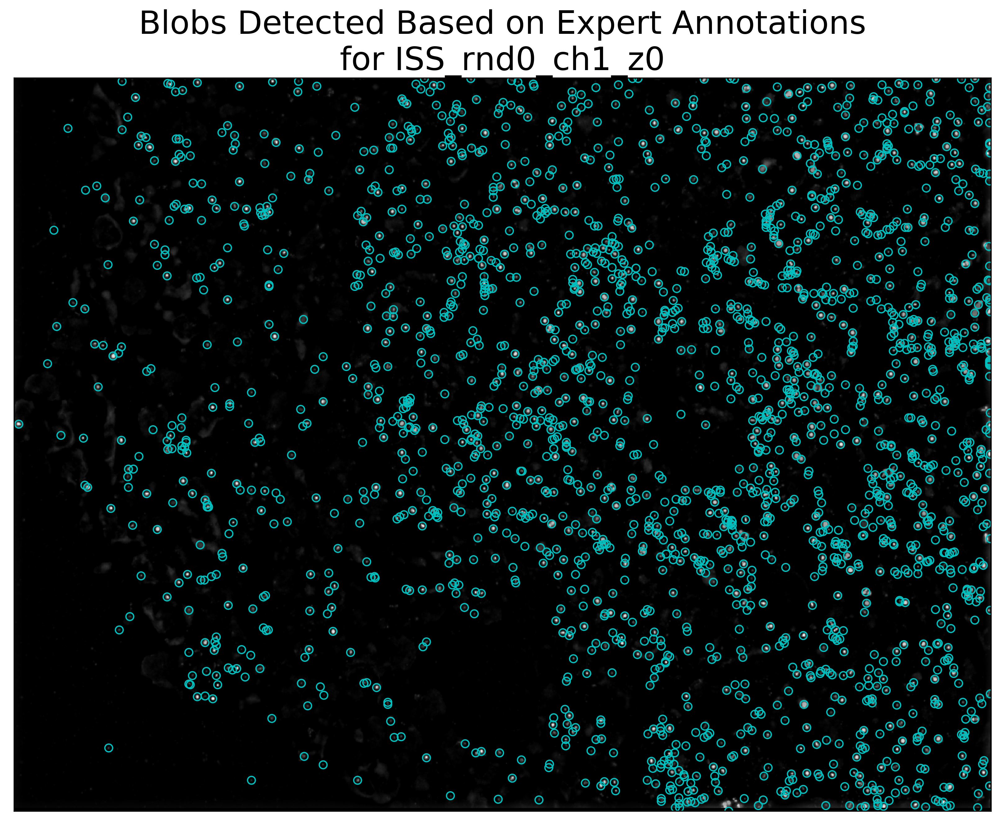

In [10]:
sigma_list = param.get_sigma_list(test_img_path, arr_expert, margin)
best_threshold, best_recall, best_precision, recall_list, precision_list = param.get_best_threshold(
    arr_expert, test_img_path, min(sigma_list), max(sigma_list), correctness_threshold, thresholds)
blobs_log_expert = blob_log(im, max_sigma=max(sigma_list), min_sigma=min(sigma_list),
                     num_sigma=10, threshold=best_threshold)

plt.figure(figsize=(im.shape[1]/100, im.shape[0]/100), dpi=300)
plt.imshow(im, cmap='gray')
plt.scatter(blobs_log_expert[:,1], blobs_log_expert[:,0],
            facecolor='None', edgecolor='c')
plt.xticks([])
plt.yticks([])
plt.xlim(0, im.shape[1])
plt.ylim(0, im.shape[0])
plt.title('Blobs Detected Based on Expert Annotations\nfor %s' % test_img_filename, fontsize=25)
plt.show()

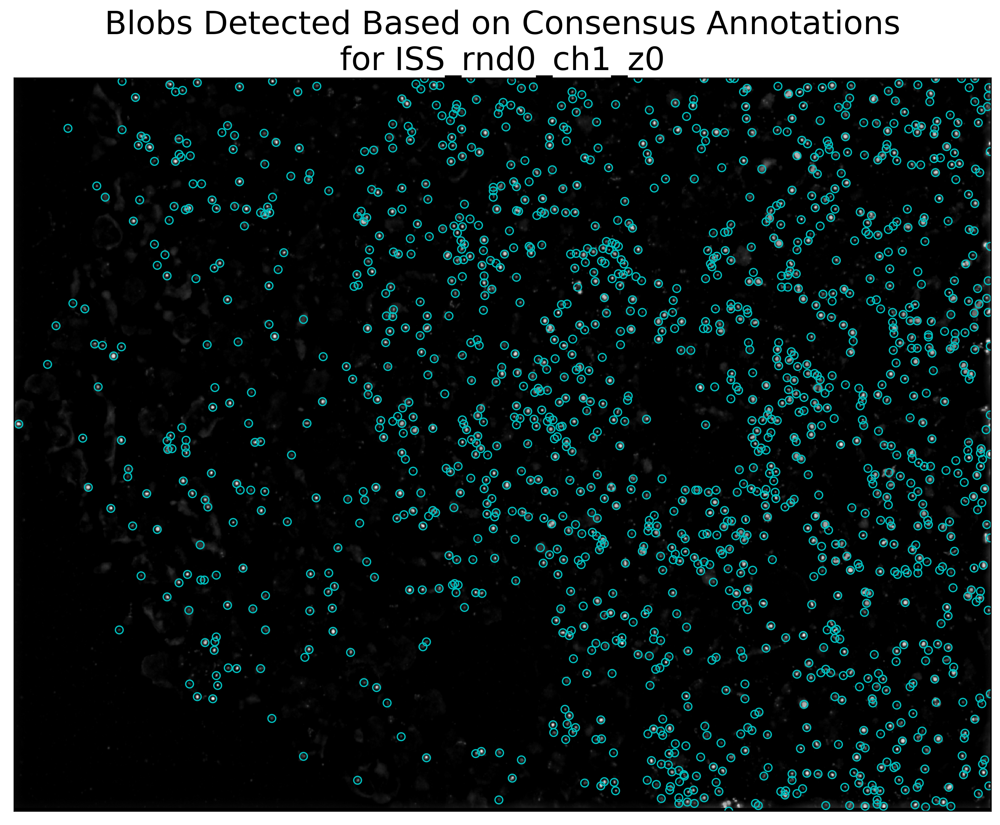

In [11]:
sigma_list = param.get_sigma_list(test_img_path, arr_consensus, margin)
best_threshold, best_recall, best_precision, recall_list, precision_list = param.get_best_threshold(
    arr_consensus, test_img_path, min(sigma_list), max(sigma_list), correctness_threshold, thresholds)
blobs_log_consensus = blob_log(im, max_sigma=max(sigma_list), min_sigma=min(sigma_list),
                     num_sigma=10, threshold=best_threshold)

plt.figure(figsize=(im.shape[1]/100, im.shape[0]/100), dpi=300)
plt.imshow(im, cmap='gray')
plt.scatter(blobs_log_consensus[:,1], blobs_log_consensus[:,0],
            facecolor='None', edgecolor='c')
plt.xticks([])
plt.yticks([])
plt.xlim(0, im.shape[1])
plt.ylim(0, im.shape[0])
plt.title('Blobs Detected Based on Consensus Annotations\nfor %s' % test_img_filename, fontsize=25)
plt.show()

# Plot incorrect blobs based on expert annotations

In [12]:
incorrect_color = 'xkcd:light magenta'

In [13]:
list_blobs_expert = []
for a, b, c in blobs_log_expert:
    list_blobs_expert.append([b, a])
arr_blobs_expert = np.asarray(list_blobs_expert)

In [14]:
dist_blobs, ind = ref_kdt.query(arr_blobs_expert, k=1)
distances_blobs = [x[0] for x in dist_blobs]
df_blobs_from_expert = pd.DataFrame()
df_blobs_from_expert['x'] = blobs_log_expert[:,1]
df_blobs_from_expert['y'] = blobs_log_expert[:,0]
df_blobs_from_expert['dist_to_expert'] = distances_blobs
df_blobs_from_expert_incorrect = df_blobs_from_expert[
    df_blobs_from_expert.dist_to_expert > correctness_threshold]

In [15]:
len(df_blobs_from_expert)

2019

In [16]:
dist_expert, ind = expert_blobs_kdt.query(arr_blobs_expert, k=1)
distances_blob_expert= [x[0] for x in dist_expert]
df_ref = pd.DataFrame()
df_ref['dist_to_expert_blob'] = distances_blob_expert
df_ref_correct_per_expert = df_ref[
    df_ref.dist_to_expert_blob > correctness_threshold]

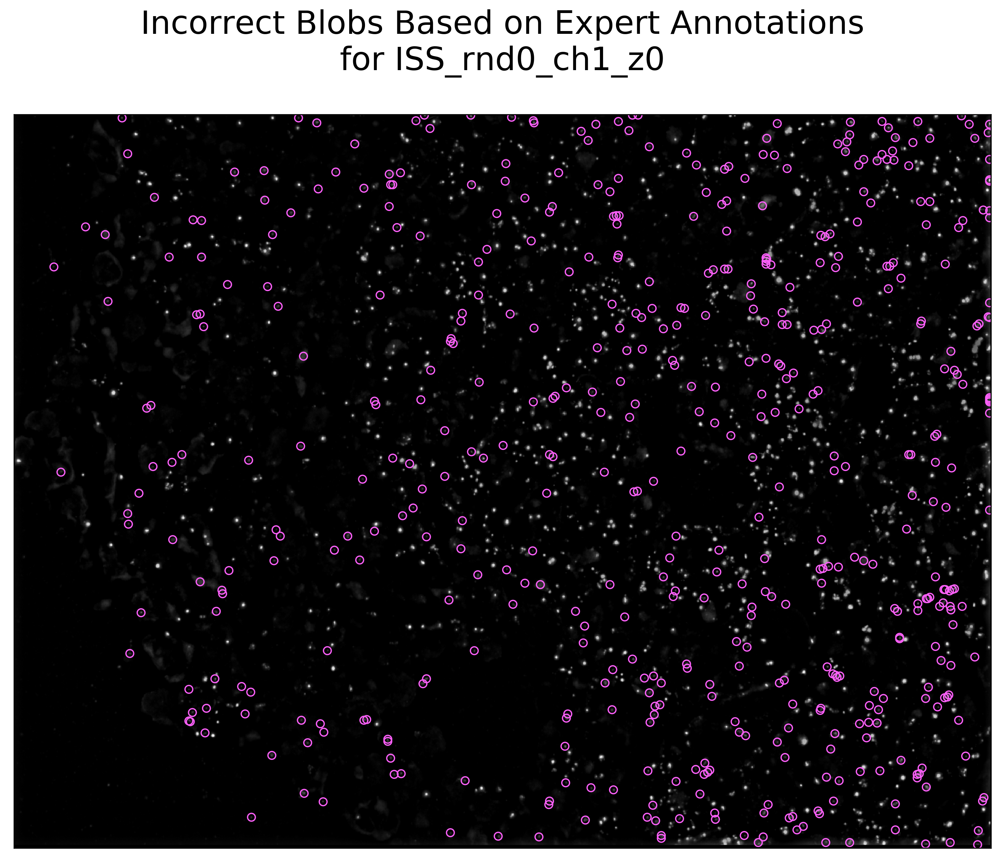

In [31]:
plt.figure(figsize=(im.shape[1]/100, im.shape[0]/100), dpi=300)
plt.imshow(im, cmap='gray')
plt.scatter(df_blobs_from_expert_incorrect.x, df_blobs_from_expert_incorrect.y,
            facecolor='None', edgecolor=incorrect_color)
plt.xlim(0, im.shape[1])
plt.ylim(0, im.shape[0])
plt.xticks([])
plt.yticks([])
plt.title('Incorrect Blobs Based on Expert Annotations\nfor %s\n' % test_img_filename, fontsize=25)
# plt.savefig('incorrect_blobs_based_on_expert_for_%s.pdf' % test_img_filename, transparent=True, bbox_inches="tight")
plt.show()

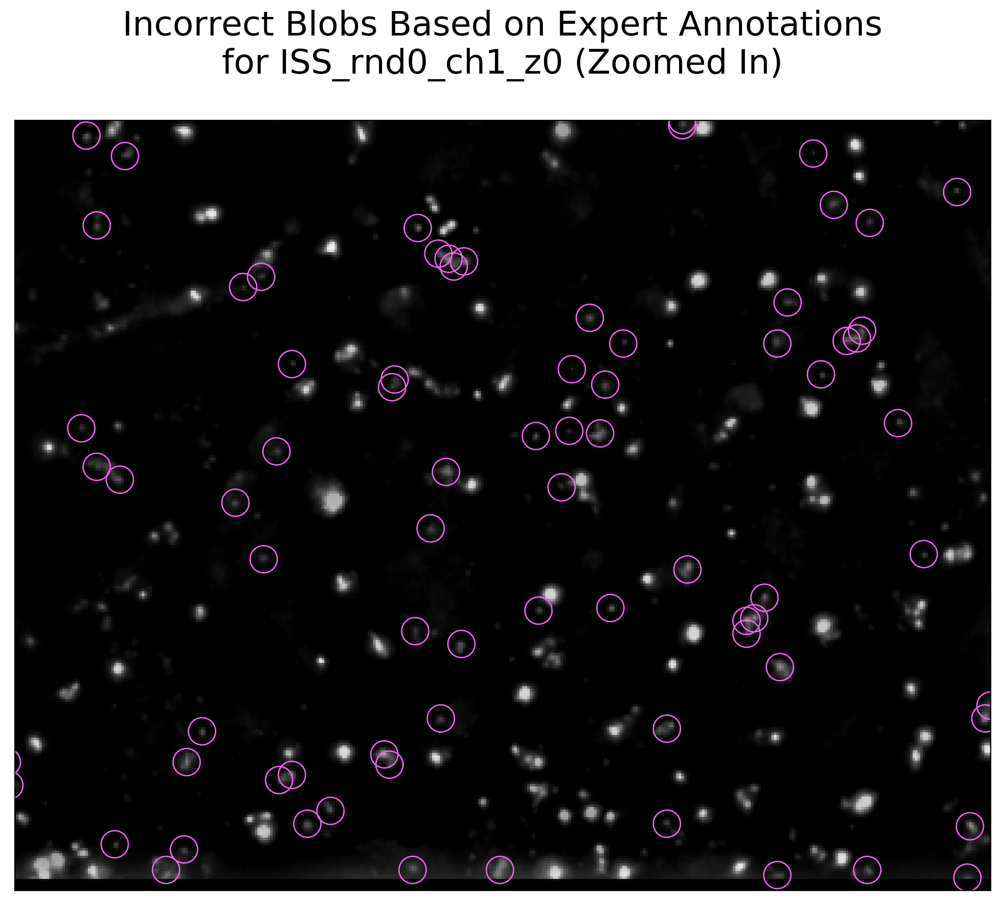

In [18]:
plt.figure(figsize=(im.shape[1]/100, im.shape[0]/100), dpi=300)
plt.imshow(im, cmap='gray')
plt.scatter(df_blobs_from_expert_incorrect.x, df_blobs_from_expert_incorrect.y,
            facecolor='None', edgecolor=incorrect_color, s=400)
plt.xlim(1000, 1380)
plt.ylim(0, 300)
plt.xticks([])
plt.yticks([])
plt.title('Incorrect Blobs Based on Expert Annotations\nfor %s (Zoomed In)\n' % test_img_filename, fontsize=25)
# plt.savefig('incorrect_blobs_based_on_expert_for_%s_zoomed.pdf' % test_img_filename, transparent=True, bbox_inches="tight")
plt.show()

In [19]:
precision = 1 - len(df_blobs_from_expert_incorrect)/len(df_blobs_from_expert)
print('Precision of blobs based on expert annotations:', precision)

Precision of blobs based on expert annotations: 0.7513620604259534


In [20]:
recall = len(df_ref_correct_per_expert)/len(df_ref)
print('Recall of blobs based on expert annotations:', recall)

Recall of blobs based on expert annotations: 0.24863793957404656


# Plot incorrect blobs based on consensus annotations

In [21]:
list_blobs_consensus = []
for a, b, c in blobs_log_consensus:
    list_blobs_consensus.append([b, a])
arr_blobs_consensus = np.asarray(list_blobs_consensus)

In [22]:
dist_blobs, ind = ref_kdt.query(arr_blobs_consensus, k=1)
distances_blobs = [x[0] for x in dist_blobs]
df_blobs_from_consensus = pd.DataFrame()
df_blobs_from_consensus['x'] = blobs_log_consensus[:,1]
df_blobs_from_consensus['y'] = blobs_log_consensus[:,0]
df_blobs_from_consensus['dist_to_expert'] = distances_blobs
df_blobs_from_consensus_incorrect = df_blobs_from_consensus[
    df_blobs_from_consensus.dist_to_expert > correctness_threshold]

In [23]:
len(df_blobs_from_consensus)

1388

In [24]:
dist_consensus, ind = expert_blobs_kdt.query(arr_blobs_consensus, k=1)
distances_blob_consensus = [x[0] for x in dist_consensus]
df_ref = pd.DataFrame()
df_ref['dist_to_consensus_blob'] = distances_blob_consensus
df_ref_correct_per_consensus = df_ref[
    df_ref.dist_to_consensus_blob > correctness_threshold]

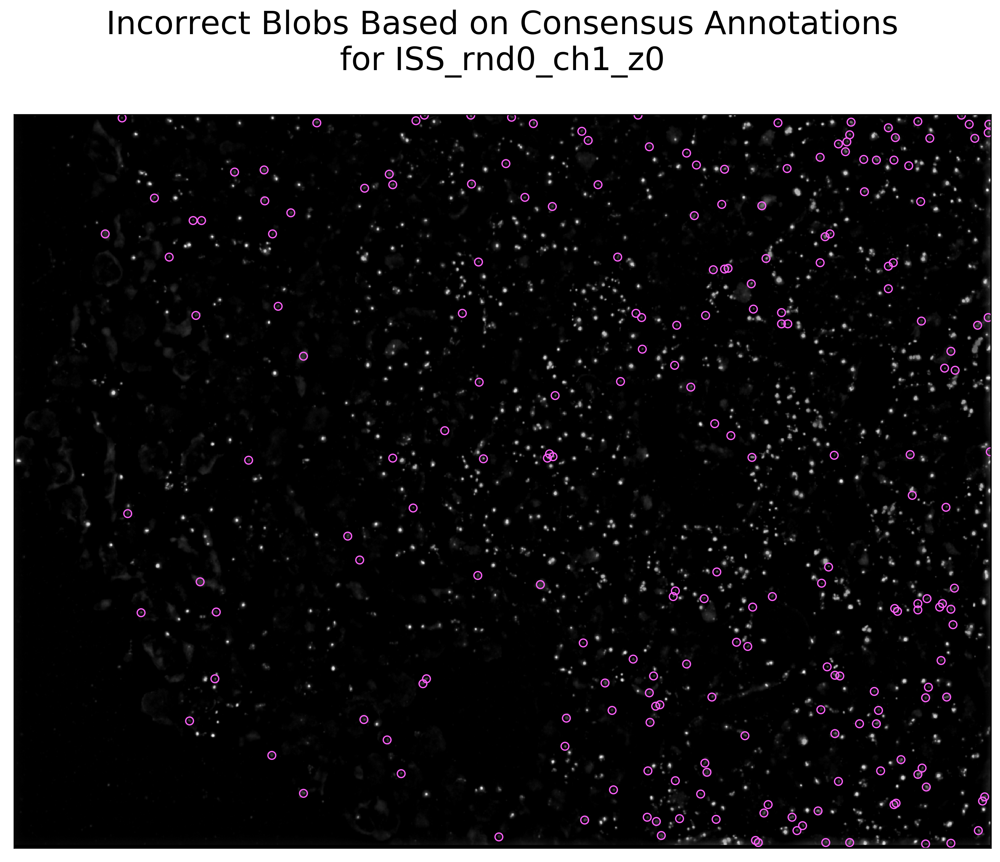

In [32]:
plt.figure(figsize=(im.shape[1]/100, im.shape[0]/100), dpi=300)
plt.imshow(im, cmap='gray')
plt.scatter(df_blobs_from_consensus_incorrect.x, df_blobs_from_consensus_incorrect.y,
            facecolor='None', edgecolor=incorrect_color)
plt.xlim(0, im.shape[1])
plt.ylim(0, im.shape[0])
plt.xticks([])
plt.yticks([])
plt.title('Incorrect Blobs Based on Consensus Annotations\nfor %s\n' % test_img_filename, fontsize=25)
# plt.savefig('incorrect_blobs_based_on_consensus_for_%s.pdf' % test_img_filename, transparent=True, bbox_inches="tight")
plt.show()

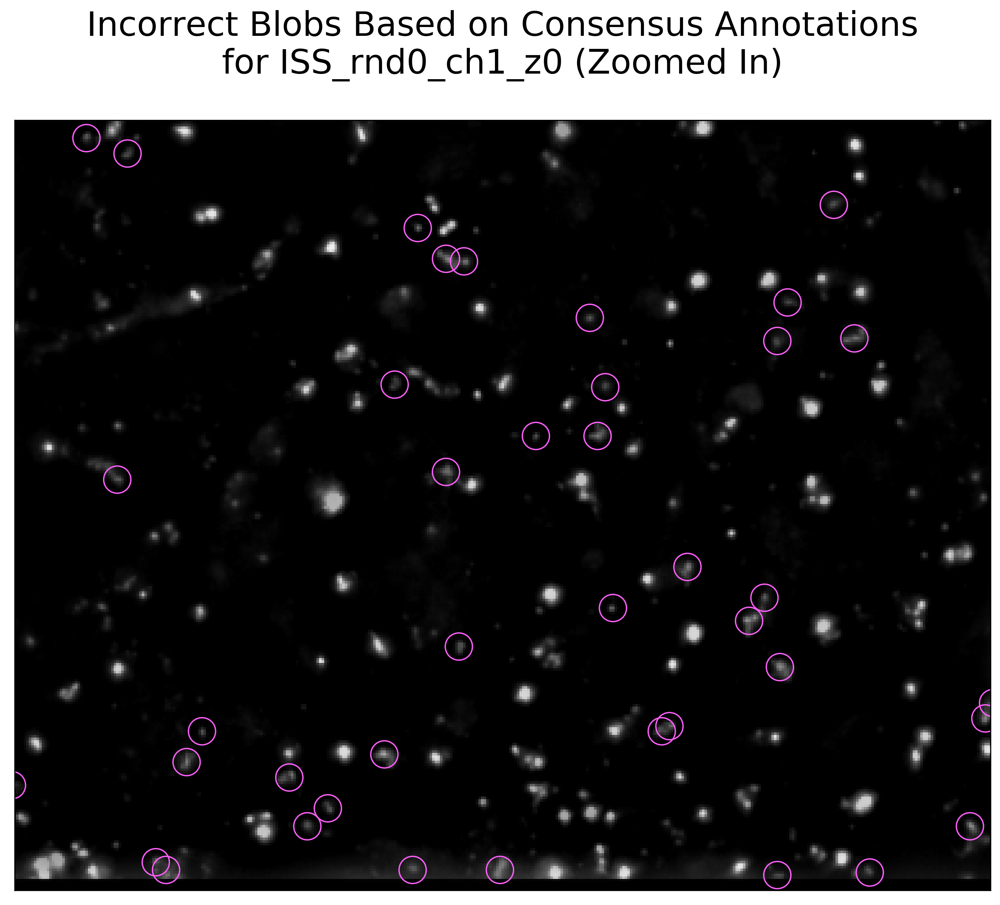

In [26]:
plt.figure(figsize=(im.shape[1]/100, im.shape[0]/100), dpi=300)
plt.imshow(im, cmap='gray')
plt.scatter(df_blobs_from_consensus_incorrect.x, df_blobs_from_consensus_incorrect.y,
            facecolor='None', edgecolor=incorrect_color, s=400)
plt.xlim(1000, 1380)
plt.ylim(0, 300)
plt.xticks([])
plt.yticks([])
plt.title('Incorrect Blobs Based on Consensus Annotations\nfor %s (Zoomed In)\n' % test_img_filename, fontsize=25)
# plt.savefig('incorrect_blobs_based_on_consensus_for_%s_zoomed.pdf' % test_img_filename, transparent=True, bbox_inches="tight")
plt.show()

In [27]:
precision = 1 - len(df_blobs_from_consensus_incorrect)/len(df_blobs_from_consensus)
print('Precision of blobs based on consensus annotations:', precision)

Precision of blobs based on consensus annotations: 0.8479827089337175


In [28]:
recall = len(df_ref_correct_per_consensus)/len(df_ref)
print('Recall of blobs based on consensus annotations:', recall)

Recall of blobs based on consensus annotations: 0.15201729106628242
